# Input Functions, esp. for [15O]CO
## Setup

In [1]:
import os
import sys
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), os.pardir)))

In [2]:
# system functions that are always useful to have
import time
from pprint import pprint

# basic numeric setup
import numpy as np

from RadialArteryContext import RadialArteryContext
from BoxcarContext import BoxcarContext

%matplotlib inline

In [3]:
# define data & models; everything is decay corrected
kerndir = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2024", "data", "kernels")
petdir = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2024", "data", "ses-20221207093856", "pet")
idif = os.path.join(petdir, "sub-108250_ses-20221207093856_trc-co_proc-MipIdif_idif.nii.gz")
twil = os.path.join(petdir, "sub-108250_ses-20221207093856_trc-co_proc-TwiliteKit-do-make-input-func-nomodel_inputfunc.nii.gz")
kern = os.path.join(kerndir, "kernel_hct=42.8.nii.gz")


### Defining truths for Artery

```
    v[0] = u[0] * 30                # t_0
    v[1] = u[1] * 30                # \tau_2 ~ t_2 - t_0
    v[2] = u[2] * 20                # \alpha - 1
    v[3] = u[3] * 30 + 3            # 1/\beta
    v[4] = u[4] * 2.5 + 0.5         # p
    v[5] = u[5] * 3 - 3             # \delta p_2 ~ p_2 - p
    v[6] = u[6] * 3 - 3             # \delta p_3 ~ p_3 - p_2
    v[7] = u[7] * 5 * halflife      # 1/\gamma for s.s.
    v[8] = u[8] * 0.9               # f_2
    v[9] = u[9] * 0.9               # f_3
    v[10] = u[10] * 4 + 0.5         # A is amplitude adjustment
    v[11] = u[11] * sigma           # sigma ~ fraction of M0
```

In [4]:
truths_twil = [
    4.14761395e+00,  5.95682250e+00,  2.32425030e+00,  1.07635194e+01,
    2.48968966e+00, -1.67893438e+00, -1.68676959e+00,  3.77449412e+02,
    1.10305667e-01,  1.49346067e-01,  2.59586876e+00,  3.31805950e-02
]

truths_idif = [
    6.07946335e+00,  8.73521656e-01,  2.58482068e+00,  7.34898585e+00,
    1.79162034e+00, -1.03802552e+00, -1.61665884e+00,  4.11248278e+02,
    1.11689728e-01,  1.69004469e-01,  2.47939672e+00,  1.76489299e-02
]

# Inspect RadialArtery

In [5]:
dd = {
    "input_func_fqfn": twil,
    "kernel_fqfn": kern,
    "tag": "playground_ra",
    "nlive": 1000
}
ra = RadialArteryContext(dd)

### Plot RadialArtery ra

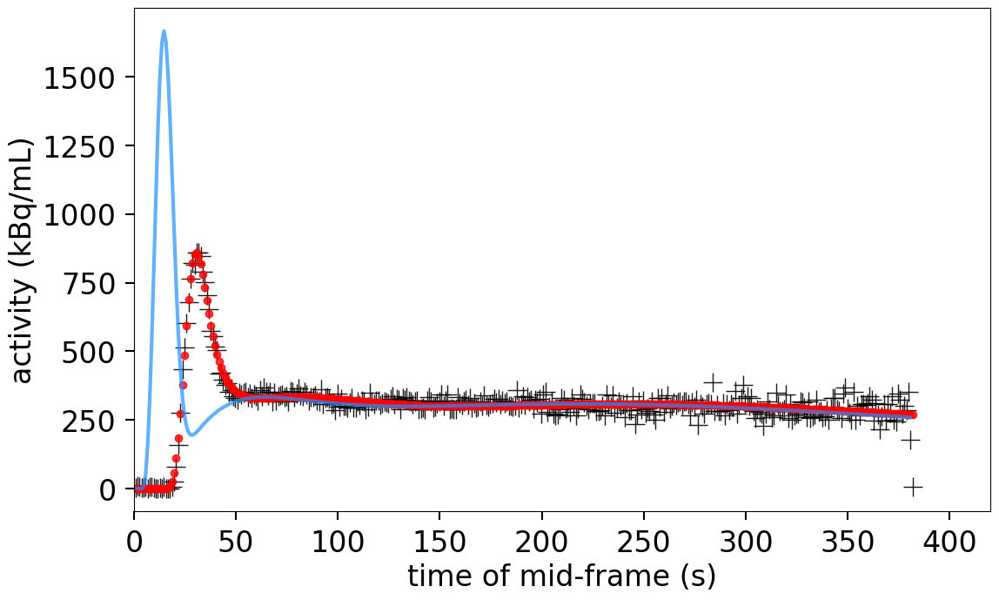

In [6]:
ra.plotting.truths_plot(truths_twil)

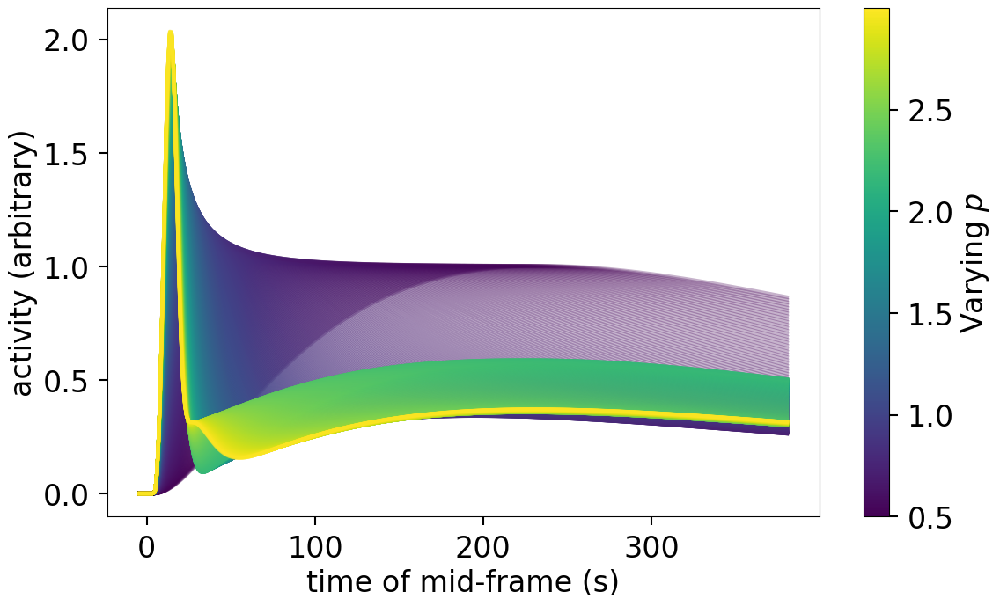

In [7]:
ra.plotting.variations_plot(
    truths_twil, 
    tindex=4, tmin=0.5, tmax=3, 
    ncolors=1000, alpha=0.3, linewidth=3, 
    do_save=False)

### Let's sample from this distribution of ra using the default `dynesty` settings with `'slice'`.

Previously, 4bolus model with t^(alpha - 1) gave:  
    # iter: 23900 | batch: 6 | bound: 22 | nc: 1 | ncall: 2130740 | eff(%):  1.107 |   
    # loglstar: 385.219 < 396.293 < 393.275 | logz: 347.713 +/-  0.256 | stop:  0.912  

46891it [05:07, 152.55it/s, batch: 1 | bound: 8 | nc: 1 | ncall: 3501013 | eff(%):  1.309 | loglstar: 765.828 < 770.892 < 768.428 | logz: 733.711 +/-  0.188 | stop:  0.836]              


DynestyPlotting.results_plot.dyplot.runplot: caught a ValueError: Axis limits cannot be NaN or Inf


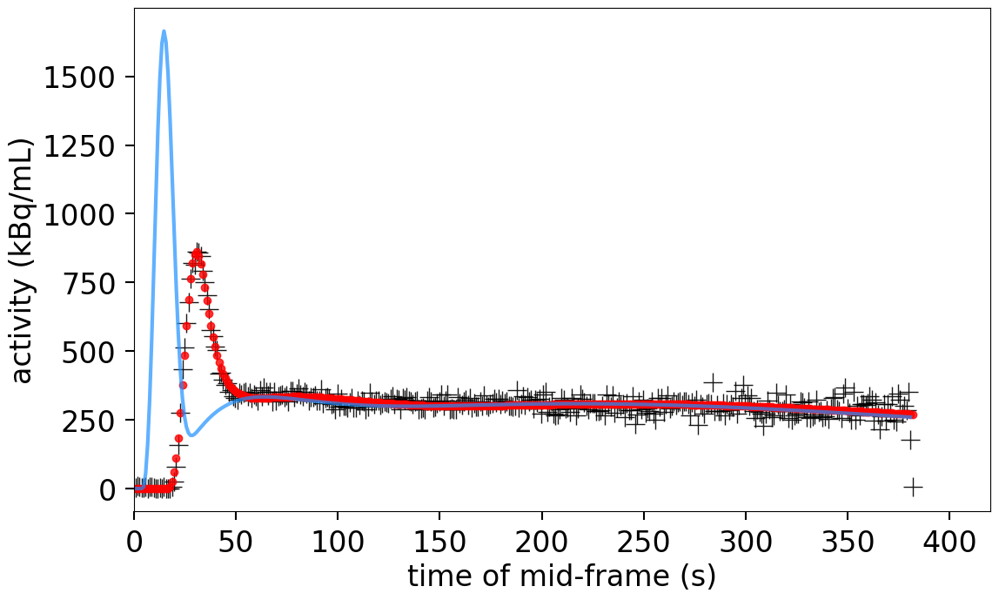

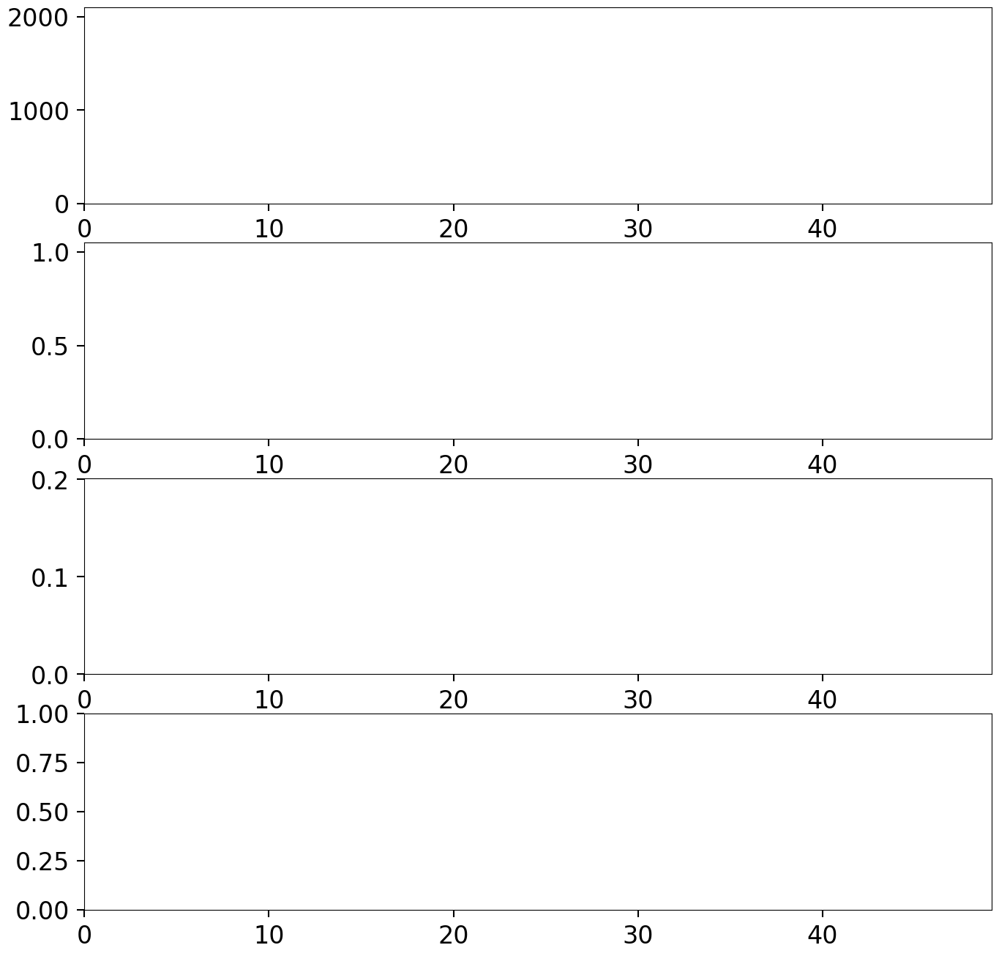

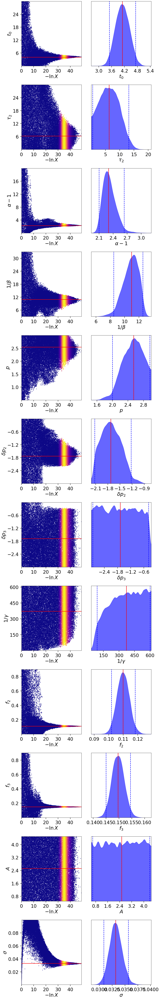

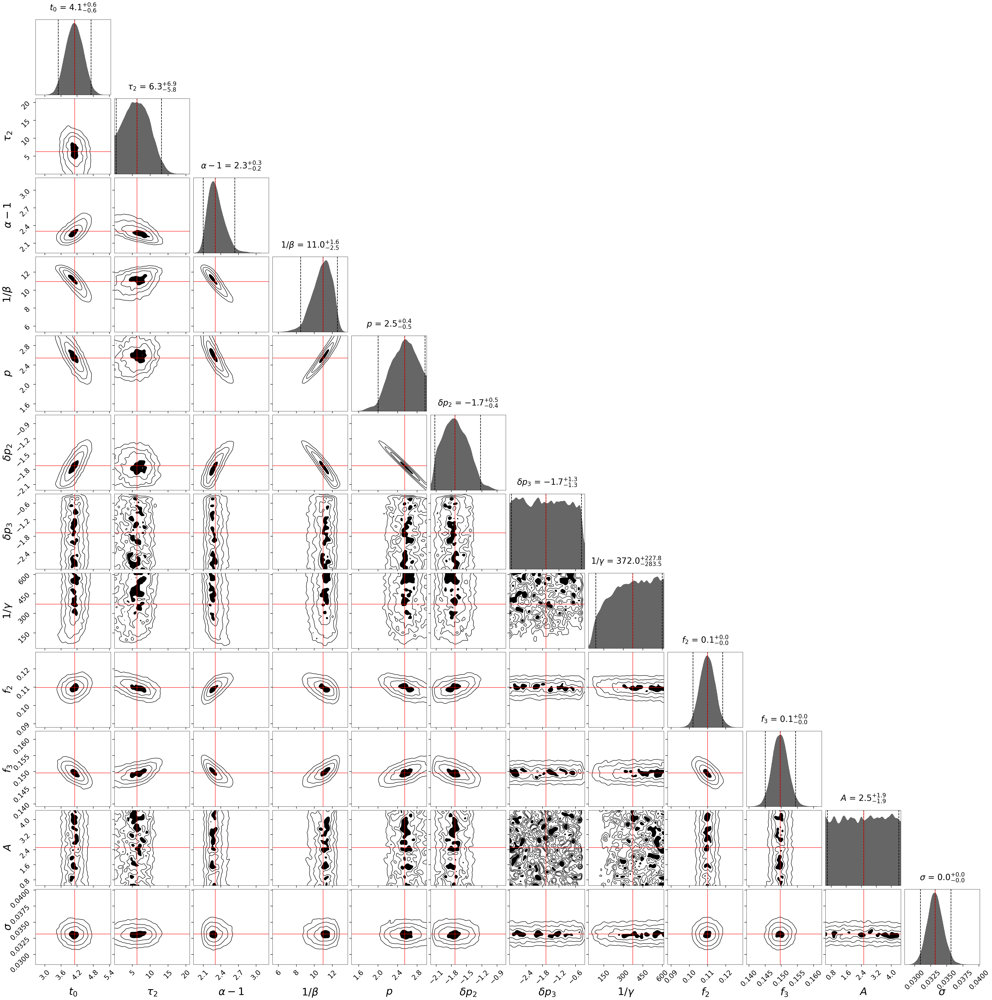

In [8]:
results_ra = ra.solver.run_nested(print_progress=True)
ra.plotting.results_plot()

# Inspect Boxcar

In [9]:
dd = {
    "input_func_fqfn": idif,
    "tag": "playground_bc",
    "nlive": 1000
}
bc = BoxcarContext(dd)

### Plot Boxcar bc

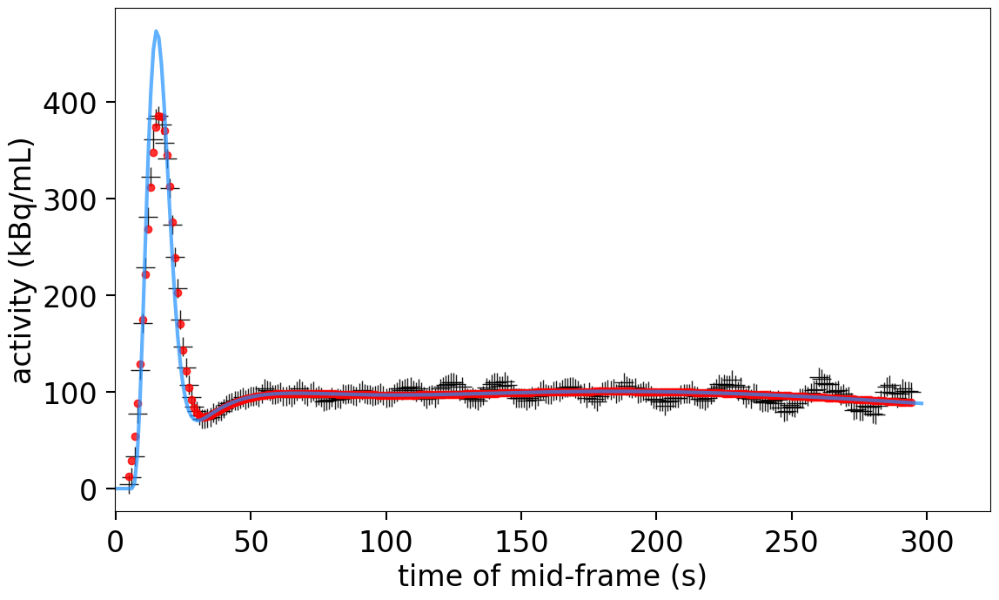

In [10]:
bc.plotting.truths_plot(truths_idif)

### Let's sample from this distribution of bc using the default `dynesty` settings with `'slice'`.

Previously, 4bolus model with t^(alpha - 1) gave:  
    # iter: 23900 | batch: 6 | bound: 22 | nc: 1 | ncall: 2130740 | eff(%):  1.107 |   
    # loglstar: 385.219 < 396.293 < 393.275 | logz: 347.713 +/-  0.256 | stop:  0.912  

52259it [01:38, 531.74it/s, batch: 1 | bound: 8 | nc: 1 | ncall: 3933485 | eff(%):  1.302 | loglstar: 758.096 < 764.078 < 760.847 | logz: 721.494 +/-  0.200 | stop:  0.765]             


DynestyPlotting.results_plot.dyplot.runplot: caught a ValueError: Axis limits cannot be NaN or Inf


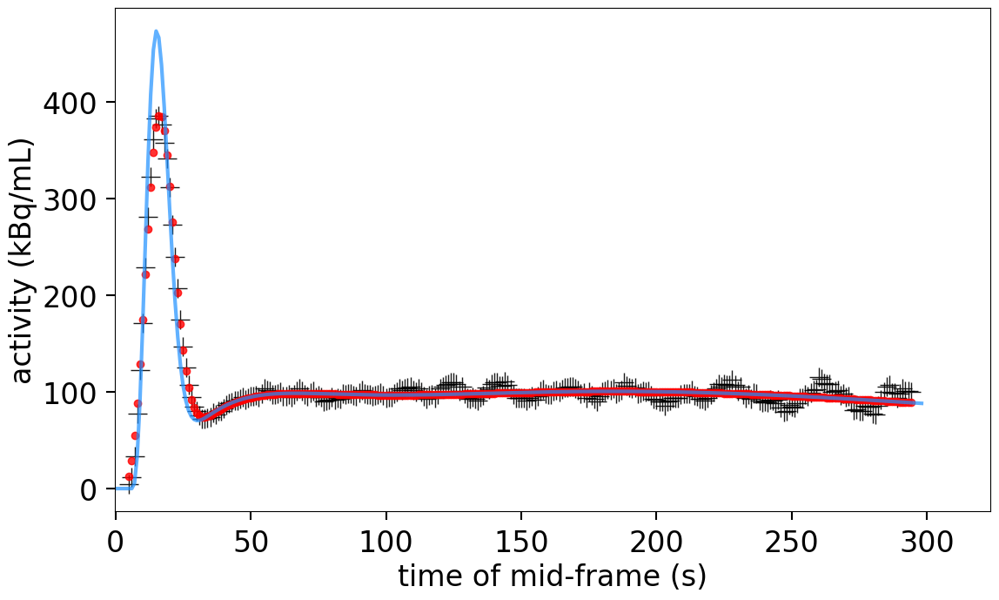

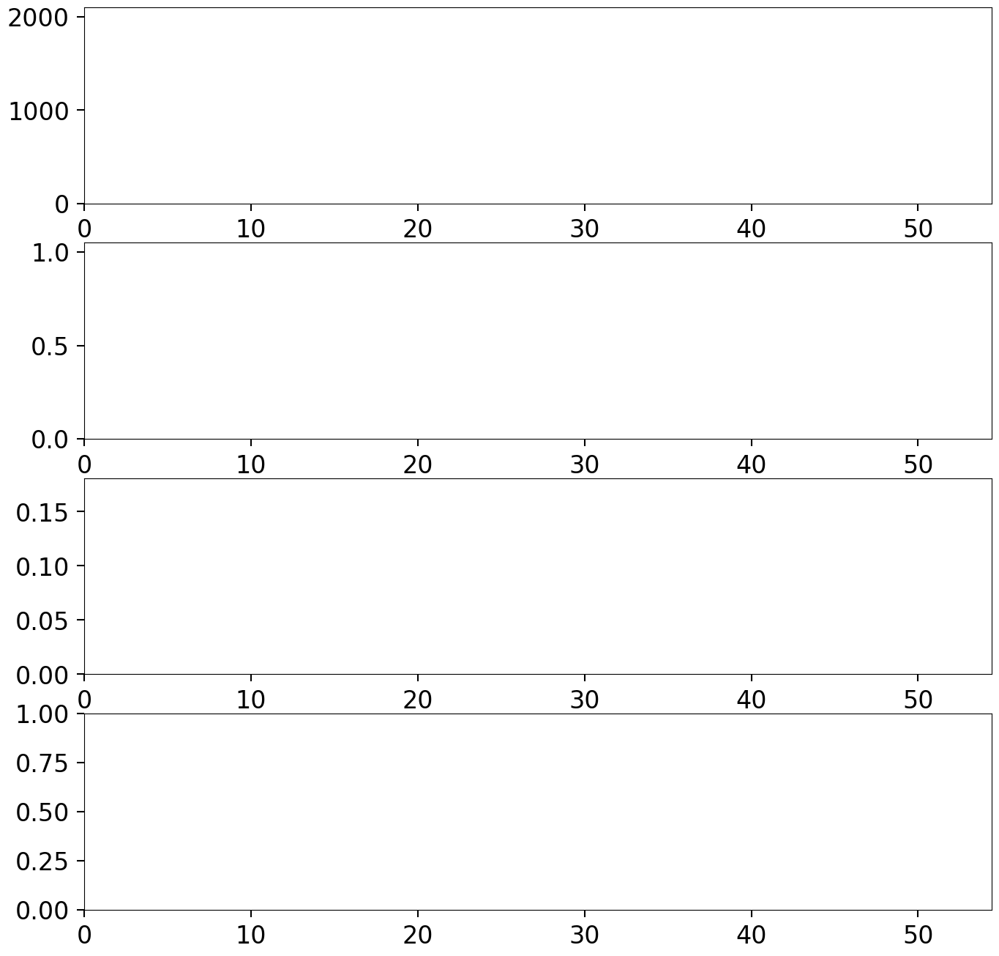

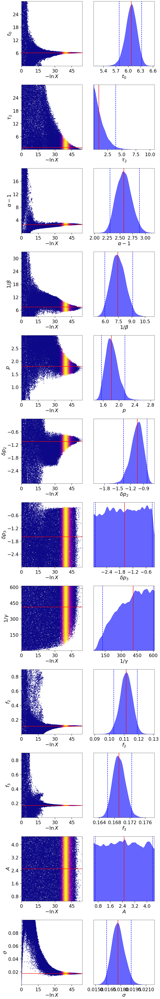

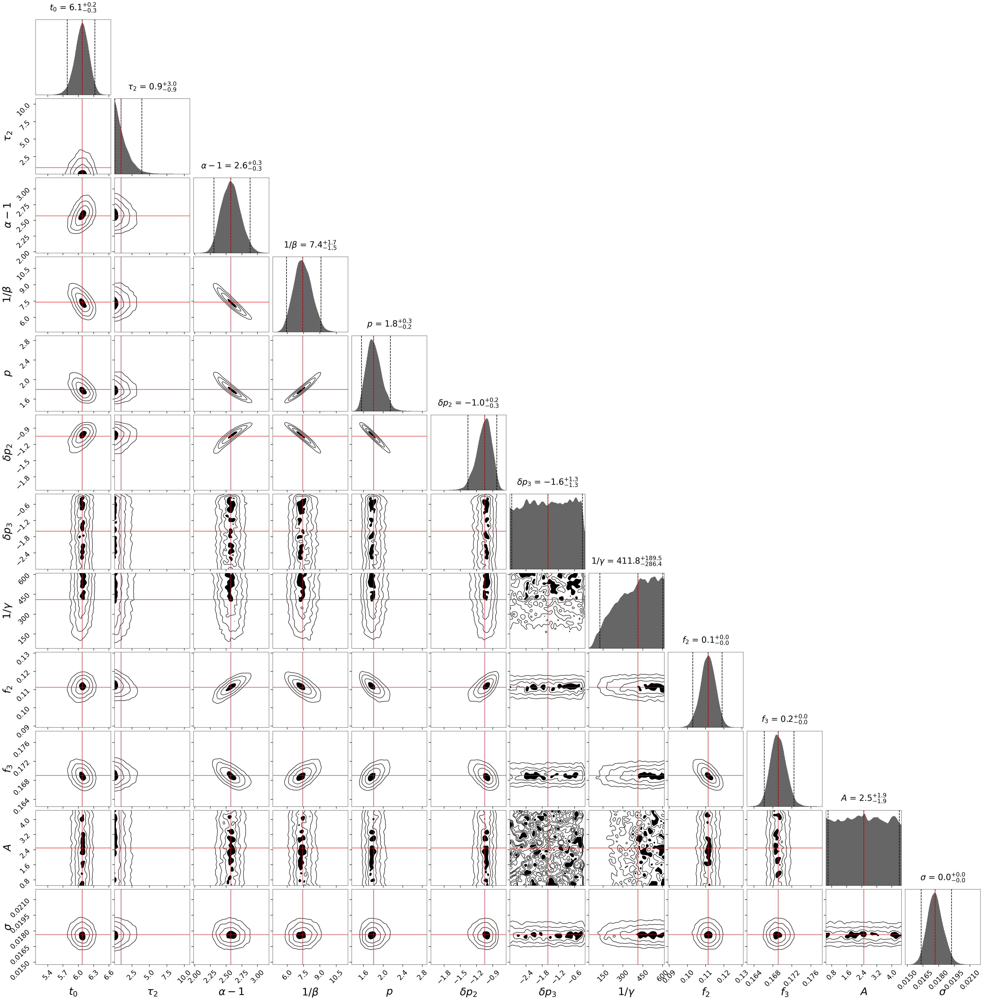

In [11]:
results_bc = bc.solver.run_nested(print_progress=True)
bc.plotting.results_plot()

In [12]:
pprint(ra.solver.truths)

array([ 4.10167131e+00,  6.26326520e+00,  2.30297324e+00,  1.09580918e+01,
        2.54418362e+00, -1.72877041e+00, -1.67771405e+00,  3.71963986e+02,
        1.09889504e-01,  1.49663187e-01,  2.52208116e+00,  3.31775052e-02])


In [13]:
pprint(bc.solver.truths)

array([ 6.07207260e+00,  9.18855313e-01,  2.57373513e+00,  7.40839366e+00,
        1.80262280e+00, -1.04766672e+00, -1.59199200e+00,  4.11784834e+02,
        1.11367919e-01,  1.69085734e-01,  2.50230090e+00,  1.76542079e-02])
